<a href="https://colab.research.google.com/github/azizy-123/CognoRise-InfoTech-Internship/blob/main/Covid_Detectoin_CognoRise_InfoTech.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

**Covid Detection - This is the second project in CognoInfo Tech Internship**

In [ ]:
# Hello, this is my second project in CognoInfo Tech Internship,
# here i tried to develop a model to detedt the X-RAYs images to classify it
# one from three categories (Covid, Pneumonia, Normal),
# I used the DL in this after i converted the images from BGR to RGB fromat,
# because it sutiable and good dealed with CNN

In [ ]:
# This section imports various modules needed for file handling, downloading, and unzipping.
import os
import sys
from tempfile import NamedTemporaryFile
from urllib.request import urlopen
from urllib.parse import unquote, urlparse
from urllib.error import HTTPError
from zipfile import ZipFile
import tarfile
import shutil

CHUNK_SIZE = 40960
DATA_SOURCE_MAPPING = 'covid19-radiography-database:https%3A%2F%2Fstorage.googleapis.com%2Fkaggle-data-sets%2F576013%2F3324348%2Fbundle%2Farchive.zip%3FX-Goog-Algorithm%3DGOOG4-RSA-SHA256%26X-Goog-Credential%3Dgcp-kaggle-com%2540kaggle-161607.iam.gserviceaccount.com%252F20240929%252Fauto%252Fstorage%252Fgoog4_request%26X-Goog-Date%3D20240929T075311Z%26X-Goog-Expires%3D259200%26X-Goog-SignedHeaders%3Dhost%26X-Goog-Signature%3D5f164701f3c194146264a14098b47fac1daf56dc6a16d9749a99a3b506803dcc896cac1dd21a168a13222923a65e1f005318cef2897963027f8ade01c72006e147d46756d4ac740ab04be7aa17240d29793fceb0c3834020ba302f9cc262152bc4fdca978b726c6a319e26b36fcfdd2a1b4dc9330441a6bdc03a4b9ecde1427bf3914d04ec6150c9bb030bbaf4d17bee12fa60bd189b13da0322d30d591f68c0614bb46b7b5a1b0337489b1b266de76459efbbd278e3e389e61d8457adaef285828b4a936eab2f7b264a7bbec8d7d641f23dd090b7793b068b042c3fd74ae089b356f956cab4164470968962f717be28999977a5500f9e8060d2ed3d170fc62e'

KAGGLE_INPUT_PATH='/kaggle/input'
KAGGLE_WORKING_PATH='/kaggle/working'
KAGGLE_SYMLINK='kaggle'

!umount /kaggle/input/ 2> /dev/null
shutil.rmtree('/kaggle/input', ignore_errors=True)
os.makedirs(KAGGLE_INPUT_PATH, 0o777, exist_ok=True)
os.makedirs(KAGGLE_WORKING_PATH, 0o777, exist_ok=True)

try:
  os.symlink(KAGGLE_INPUT_PATH, os.path.join("..", 'input'), target_is_directory=True)
except FileExistsError:
  pass
try:
  os.symlink(KAGGLE_WORKING_PATH, os.path.join("..", 'working'), target_is_directory=True)
except FileExistsError:
  pass

for data_source_mapping in DATA_SOURCE_MAPPING.split(','):
    directory, download_url_encoded = data_source_mapping.split(':')
    download_url = unquote(download_url_encoded)
    filename = urlparse(download_url).path
    destination_path = os.path.join(KAGGLE_INPUT_PATH, directory)
    try:
        with urlopen(download_url) as fileres, NamedTemporaryFile() as tfile:
            total_length = fileres.headers['content-length']
            print(f'Downloading {directory}, {total_length} bytes compressed')
            dl = 0
            data = fileres.read(CHUNK_SIZE)
            while len(data) > 0:
                dl += len(data)
                tfile.write(data)
                done = int(50 * dl / int(total_length))
                sys.stdout.write(f"\r[{'=' * done}{' ' * (50-done)}] {dl} bytes downloaded")
                sys.stdout.flush()
                data = fileres.read(CHUNK_SIZE)
            if filename.endswith('.zip'):
              with ZipFile(tfile) as zfile:
                zfile.extractall(destination_path)
            else:
              with tarfile.open(tfile.name) as tarfile:
                tarfile.extractall(destination_path)
            print(f'\nDownloaded and uncompressed: {directory}')
    except HTTPError as e:
        print(f'Failed to load (likely expired) {download_url} to path {destination_path}')
        continue
    except OSError as e:
        print(f'Failed to load {download_url} to path {destination_path}')
        continue

print('Data source import complete.')

[==================================================] 816029038 bytes downloaded
Downloaded and uncompressed: covid19-radiography-database
Data source import complete.


In [ ]:
# Import the essential libraries.
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import seaborn as sns
#deep learning
import tensorflow as tf
from tensorflow import keras
from keras.layers import Dropout, Activation , BatchNormalization , Flatten , Dense , Conv2D , MaxPool2D

from keras.utils import to_categorical

#machine learn
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import classification_report , confusion_matrix

In [ ]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

Streaming output truncated to the last 5000 lines.
/kaggle/input/covid19-radiography-database/COVID-19_Radiography_Dataset/Lung_Opacity/masks/Lung_Opacity-521.png
/kaggle/input/covid19-radiography-database/COVID-19_Radiography_Dataset/Lung_Opacity/masks/Lung_Opacity-3579.png
/kaggle/input/covid19-radiography-database/COVID-19_Radiography_Dataset/Lung_Opacity/masks/Lung_Opacity-3710.png
/kaggle/input/covid19-radiography-database/COVID-19_Radiography_Dataset/Lung_Opacity/masks/Lung_Opacity-4663.png
/kaggle/input/covid19-radiography-database/COVID-19_Radiography_Dataset/Lung_Opacity/masks/Lung_Opacity-3350.png
/kaggle/input/covid19-radiography-database/COVID-19_Radiography_Dataset/Lung_Opacity/masks/Lung_Opacity-4160.png
/kaggle/input/covid19-radiography-database/COVID-19_Radiography_Dataset/Lung_Opacity/masks/Lung_Opacity-2839.png
/kaggle/input/covid19-radiography-database/COVID-19_Radiography_Dataset/Lung_Opacity/masks/Lung_Opacity-4926.png
/kaggle/input/covid19-radiography-database/COV

In [ ]:
# Goal: The main purpose of the cell is to create a list called imagepath.
# This list will store the paths to all the PNG images related to COVID-19 detection within your dataset.
from tqdm import tqdm
import os
imagepath = []
for dirname, _, filenames in os.walk('/kaggle/input'):
    if 'image' in dirname:
        for filename in filenames:
            if filename.endswith('png'):
                imagepath.append(os.path.join(dirname, filename))

In [ ]:
import cv2
data = []
target = []
resize = 150

cat = {'Viral Pneumonia': 'pneumonia' , 'Normal': 'normal' , 'COVID':'covid'}

for imagepat in tqdm(imagepath):
    label = imagepat.split(os.path.sep)[-3]
    if label not in cat:
        continue
    image = cv2.imread(imagepat)
    image = cv2.cvtColor(image , cv2.COLOR_BGR2RGB)
    image = cv2.resize(image , (resize,resize))/255.0
    data.append(image)
    target.append(cat[label])


print(f"processed {len(data)} images")

100%|██████████| 21165/21165 [00:30<00:00, 703.67it/s]  

processed 15153 images


In [ ]:
# Calculate the number of the links
print(f" The number of the links is: {len(imagepath)}")

 The number of the links is: 21165


In [ ]:
# # Calculate the number of the data and target links
print(len(data))
print(len(target))

15153
15153


In [ ]:
# Show some of links for the images
print(imagepath[:5])

['/kaggle/input/covid19-radiography-database/COVID-19_Radiography_Dataset/Normal/images/Normal-6800.png', '/kaggle/input/covid19-radiography-database/COVID-19_Radiography_Dataset/Normal/images/Normal-5654.png', '/kaggle/input/covid19-radiography-database/COVID-19_Radiography_Dataset/Normal/images/Normal-2898.png', '/kaggle/input/covid19-radiography-database/COVID-19_Radiography_Dataset/Normal/images/Normal-2151.png', '/kaggle/input/covid19-radiography-database/COVID-19_Radiography_Dataset/Normal/images/Normal-3911.png']


In [ ]:
# Showing some samples of the links, here you can see them well
print(imagepath[1])
print(imagepath[2])
print(imagepath[3])
print(imagepath[4])
print(imagepath[5])

/kaggle/input/covid19-radiography-database/COVID-19_Radiography_Dataset/Normal/images/Normal-5654.png
/kaggle/input/covid19-radiography-database/COVID-19_Radiography_Dataset/Normal/images/Normal-2898.png
/kaggle/input/covid19-radiography-database/COVID-19_Radiography_Dataset/Normal/images/Normal-2151.png
/kaggle/input/covid19-radiography-database/COVID-19_Radiography_Dataset/Normal/images/Normal-3911.png
/kaggle/input/covid19-radiography-database/COVID-19_Radiography_Dataset/Normal/images/Normal-9016.png


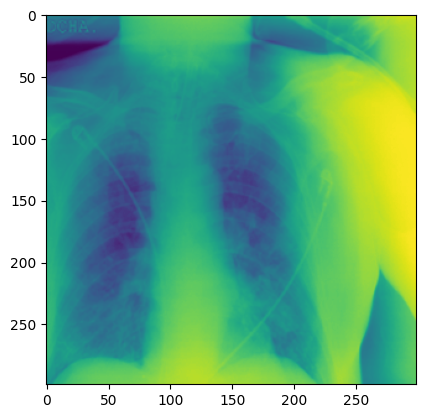

In [ ]:
# Show the content of one image
import matplotlib.image as mpimg

# Sample image path (using the first image for this example)
image_path = '/kaggle/input/covid19-radiography-database/COVID-19_Radiography_Dataset/COVID/images/COVID-887.png'

# Read and display the image
img = mpimg.imread(image_path)
plt.imshow(img)
plt.show()

In [ ]:
# Import the label Encoder
# This function is used to convert the images to numerical
# For example, giving binary digit for each one
# For example, [0,0,0] equels 0 it's for first category  ->> 'covid' is encoded as 0
# For example, [0,0,1] equels 1 it's for second category ->> 'normal' is encoded as 1
# For example, [0,1,0] equels 2 it's for third category ->> 'pneumonia' is encoded as 2

le = LabelEncoder()
label= le.fit_transform(target)
label = to_categorical(label)

print(le.classes_)
print(label[0])

['covid' 'normal' 'pneumonia']
[0. 1. 0.]


In [ ]:
# First split into training and testing sets
(x_train, x_test, y_train, y_test) = train_test_split(data, label, test_size=0.20, stratify=label, random_state=42)

# Second split into training and validation sets
(x_train, x_val, y_train, y_val) = train_test_split(x_train, y_train, test_size=0.20, stratify=y_train, random_state=42)

trainX = np.array(x_train)
trainY = np.array(y_train)
testX = np.array(x_test)
testY = np.array(y_test)
valX = np.array(x_val)
valY = np.array(y_val)


print(trainX.shape)
print(testX.shape)
print(trainY.shape)
print(testY.shape)
print(valX.shape)
print(valY.shape)

(9697, 150, 150, 3)
(3031, 150, 150, 3)
(9697, 3)
(3031, 3)
(2425, 150, 150, 3)
(2425, 3)


In [ ]:
# Apply the DL part

model = keras.Sequential()
#cnn layers
#first layer
model.add(Conv2D(filters=32, kernel_size=(3, 3), activation='relu', input_shape=(150, 150, 3), kernel_initializer='he_normal'))
model.add(MaxPool2D(pool_size=(2, 2)))

#second layer
model.add(Conv2D(filters=64 , kernel_size = (3,3) , activation = 'relu')),
model.add(MaxPool2D(pool_size=(2,2))),
#third layer
model.add(Conv2D(filters=128 , kernel_size = (3,3) , activation = 'relu')),
model.add(MaxPool2D(pool_size=(2,2) , strides=(1,1))),


#ann layers
#first layer
model.add(Flatten()),
model.add(Dense(64 ,activation='relu')),
model.add(Dropout(0.2)),
model.add(Dense(3 , activation = 'softmax'))

In [ ]:
# Show the summary of the data
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 148, 148, 32)      896       
                                                                 
 max_pooling2d (MaxPooling2  (None, 74, 74, 32)        0         
 D)                                                              
                                                                 
 conv2d_1 (Conv2D)           (None, 72, 72, 64)        18496     
                                                                 
 max_pooling2d_1 (MaxPoolin  (None, 36, 36, 64)        0         
 g2D)                                                            
                                                                 
 conv2d_2 (Conv2D)           (None, 34, 34, 128)       73856     
                                                                 
 max_pooling2d_2 (MaxPoolin  (None, 33, 33, 128)       0

In [ ]:
# Purpose: To configure the model for training by specifying the optimizer,
# loss function, and performance metric. This setup enables the model to learn
# effectively from the data during the training process.
model.compile(
    optimizer='adam',
    loss=tf.keras.losses.categorical_crossentropy,
    metrics=['accuracy']
)

In [ ]:
# Train the model using 20 epochs
model.fit(trainX ,trainY , epochs = 20 , batch_size = 40 , verbose=1 , validation_data =(valX , valY) ,)

Epoch 1/20
243/243 [==============================] - 54s 220ms/step - loss: 0.5704 - accuracy: 0.8012 - val_loss: 0.2967 - val_accuracy: 0.8804
Epoch 2/20
243/243 [==============================] - 48s 198ms/step - loss: 0.2831 - accuracy: 0.8862 - val_loss: 0.2096 - val_accuracy: 0.9184
Epoch 3/20
243/243 [==============================] - 48s 198ms/step - loss: 0.2024 - accuracy: 0.9239 - val_loss: 0.2127 - val_accuracy: 0.9105
Epoch 4/20
243/243 [==============================] - 48s 196ms/step - loss: 0.1588 - accuracy: 0.9447 - val_loss: 0.1876 - val_accuracy: 0.9311
Epoch 5/20
243/243 [==============================] - 47s 194ms/step - loss: 0.1317 - accuracy: 0.9518 - val_loss: 0.1418 - val_accuracy: 0.9509
Epoch 6/20
243/243 [==============================] - 47s 193ms/step - loss: 0.1112 - accuracy: 0.9610 - val_loss: 0.1483 - val_accuracy: 0.9501
Epoch 7/20
243/243 [==============================] - 47s 193ms/step - loss: 0.0866 - accuracy: 0.9687 - val_loss: 0.1861 - val_ac

In [ ]:
# Making a Predection and Evaluating Model Performance
prediction= model.predict(testX)
y_pred= np.argmax(prediction  , axis=1)

y_test = np.argmax(prediction , axis=1)
cm = confusion_matrix(y_pred , y_test)

print(cm)

95/95 [==============================] - 3s 35ms/step
[[ 744    0    0]
 [   0 1989    0]
 [   0    0  298]]


In [ ]:
class_name = le.classes_

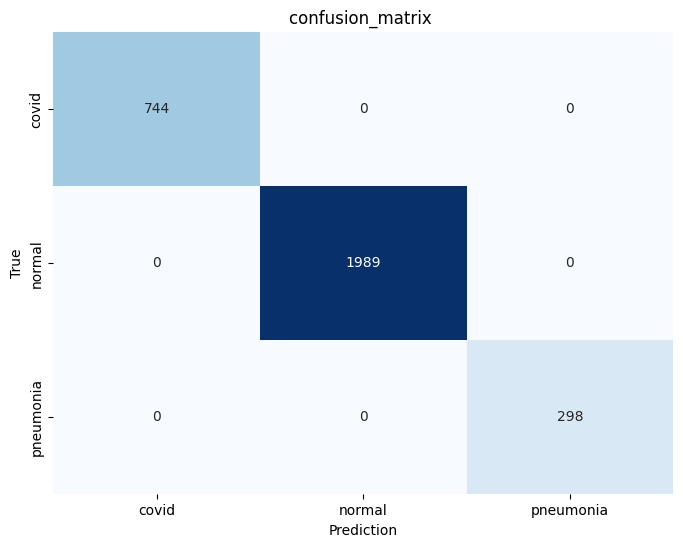

In [ ]:
confusion_matrix = pd.DataFrame(cm , index = class_name , columns= class_name)
plt.figure(figsize = (8,6))
sns.heatmap(confusion_matrix , annot=True , cbar=False ,fmt='d' ,cmap='Blues')
plt.title('confusion_matrix ')
plt.xlabel('Prediction')
plt.ylabel('True')
plt.show()

In [ ]:
print(classification_report(y_test , y_pred , target_names=class_name , digits=5))

              precision    recall  f1-score   support

       covid    1.00000   1.00000   1.00000       744
      normal    1.00000   1.00000   1.00000      1989
   pneumonia    1.00000   1.00000   1.00000       298

    accuracy                        1.00000      3031
   macro avg    1.00000   1.00000   1.00000      3031
weighted avg    1.00000   1.00000   1.00000      3031



In [ ]:
model.save('covid-detection-model.h5')

import pickle
pickle.dump(le, open('lebel_encoder.pkl','wb'))
print('save')

save


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


**REAL-TIME-DETECTION**

In [ ]:
from tensorflow.keras.models import load_model
load_models = load_model('covid-detection-model.h5')
load_le = pickle.load(open('lebel_encoder.pkl' ,'rb'))

In [ ]:
def prediction_system(image_path , load_models ,le , image_size = 150):
    #load_image
    load_image = cv2.imread(image_path)
    if load_image is None:
        raise ValueError(f"something wrong {image_path} in this path")
    #preprocessing
    image = cv2.cvtColor(load_image, cv2.COLOR_BGR2RGB)
    image_resize = cv2.resize(image ,(image_size,image_size))
    image_scaled = image_resize/255.0
    image_input = np.expand_dims(image_scaled,axis=0)
    prediction = model.predict(image_input)
    prediction_label = np.argmax(prediction)
    confidance_score = prediction[0][prediction_label]

    label = le.inverse_transform([prediction_label])[0]

    #for image
    plt.imshow(image_resize)
    plt.title(f"predicted {label} , confidance level : {confidance_score*100:.2f}%")
    plt.ylabel('off')
    plt.show()

    return label , confidance_score

1/1 [==============================] - 0s 33ms/step


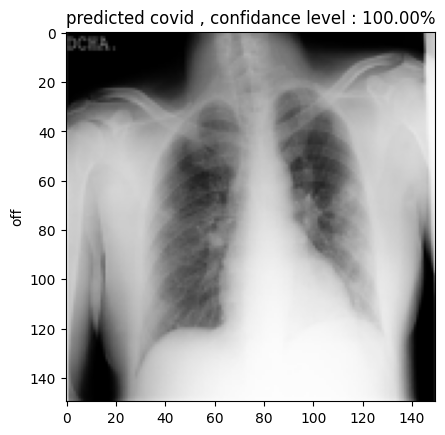

In [28]:
image_path='/kaggle/input/covid19-radiography-database/COVID-19_Radiography_Dataset/COVID/images/COVID-100.png'
prediction_label , confidance_score = prediction_system(image_path , load_model ,load_le)

1/1 [==============================] - 0s 33ms/step


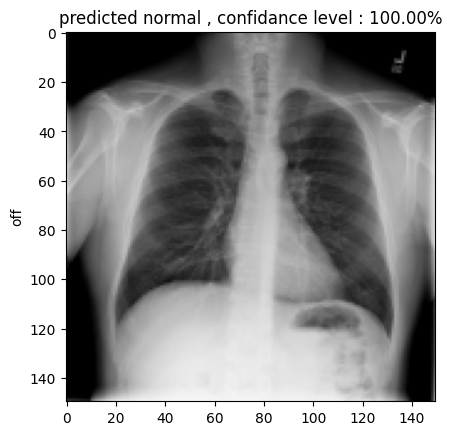

Image: /kaggle/input/covid19-radiography-database/COVID-19_Radiography_Dataset/Normal/images/Normal-6800.png
Predicted Class: normal, Confidence: 100.00%

1/1 [==============================] - 0s 34ms/step


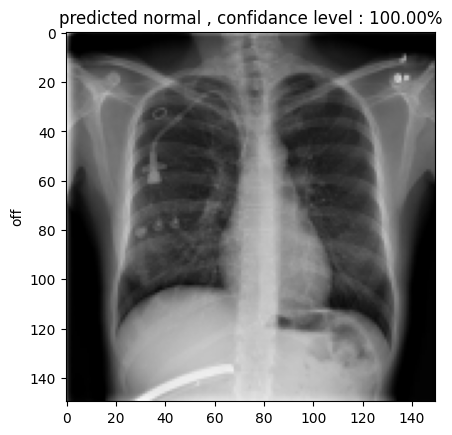

Image: /kaggle/input/covid19-radiography-database/COVID-19_Radiography_Dataset/Normal/images/Normal-2151.png
Predicted Class: normal, Confidence: 100.00%

1/1 [==============================] - 0s 31ms/step


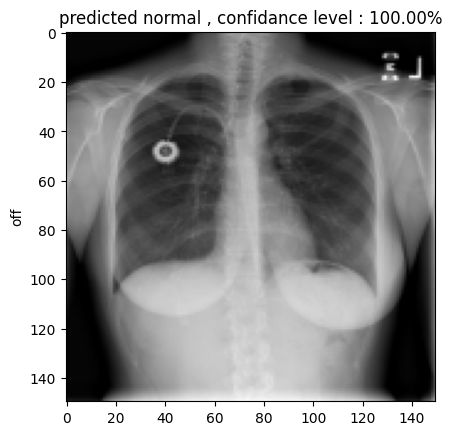

Image: /kaggle/input/covid19-radiography-database/COVID-19_Radiography_Dataset/Normal/images/Normal-9083.png
Predicted Class: normal, Confidence: 100.00%

1/1 [==============================] - 0s 33ms/step


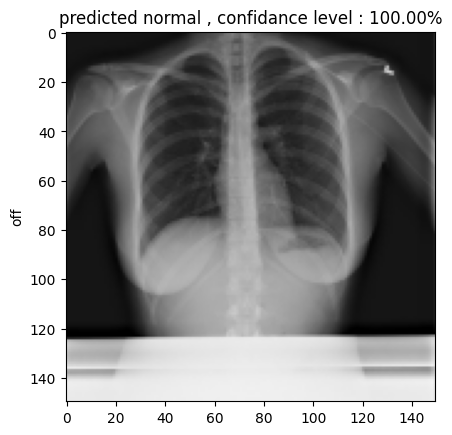

Image: /kaggle/input/covid19-radiography-database/COVID-19_Radiography_Dataset/Normal/images/Normal-1711.png
Predicted Class: normal, Confidence: 100.00%

1/1 [==============================] - 0s 33ms/step


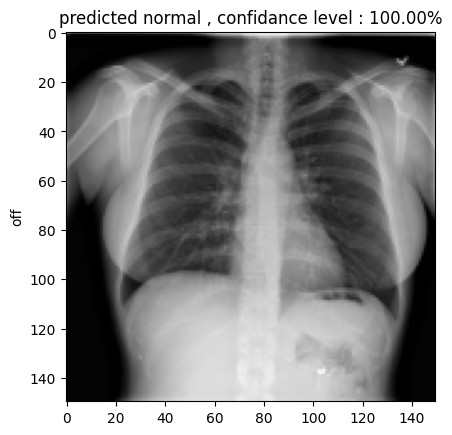

Image: /kaggle/input/covid19-radiography-database/COVID-19_Radiography_Dataset/Normal/images/Normal-7635.png
Predicted Class: normal, Confidence: 100.00%

1/1 [==============================] - 0s 31ms/step


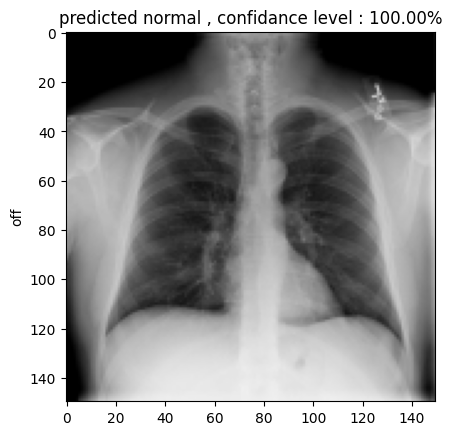

Image: /kaggle/input/covid19-radiography-database/COVID-19_Radiography_Dataset/Normal/images/Normal-4656.png
Predicted Class: normal, Confidence: 100.00%

1/1 [==============================] - 0s 33ms/step


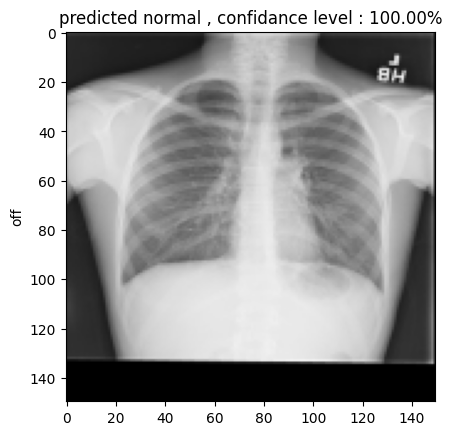

Image: /kaggle/input/covid19-radiography-database/COVID-19_Radiography_Dataset/Normal/images/Normal-8399.png
Predicted Class: normal, Confidence: 100.00%

1/1 [==============================] - 0s 33ms/step


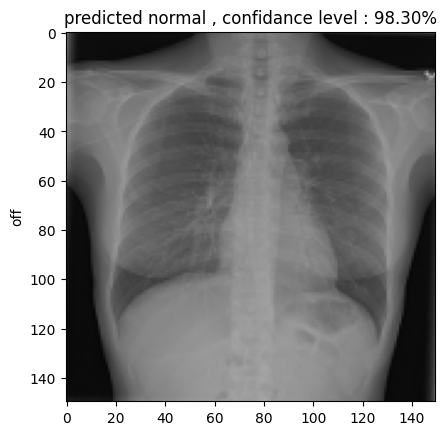

Image: /kaggle/input/covid19-radiography-database/COVID-19_Radiography_Dataset/Normal/images/Normal-4414.png
Predicted Class: normal, Confidence: 98.30%

1/1 [==============================] - 0s 32ms/step


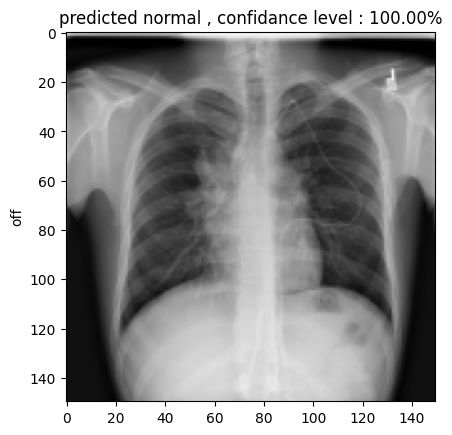

Image: /kaggle/input/covid19-radiography-database/COVID-19_Radiography_Dataset/Normal/images/Normal-10153.png
Predicted Class: normal, Confidence: 100.00%

1/1 [==============================] - 0s 32ms/step


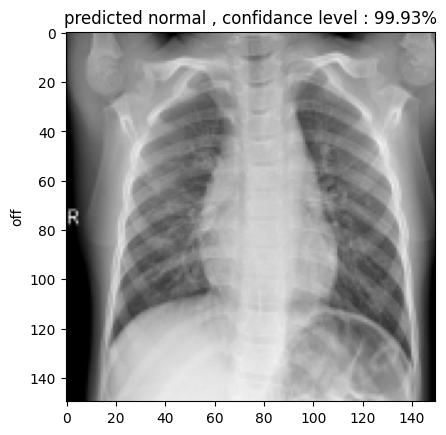

Image: /kaggle/input/covid19-radiography-database/COVID-19_Radiography_Dataset/Normal/images/Normal-1318.png
Predicted Class: normal, Confidence: 99.93%

1/1 [==============================] - 0s 32ms/step


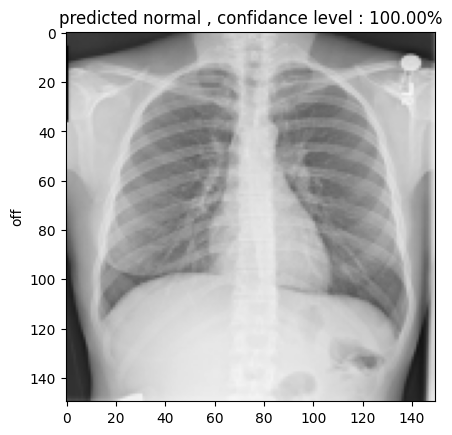

Image: /kaggle/input/covid19-radiography-database/COVID-19_Radiography_Dataset/Normal/images/Normal-4390.png
Predicted Class: normal, Confidence: 100.00%

1/1 [==============================] - 0s 33ms/step


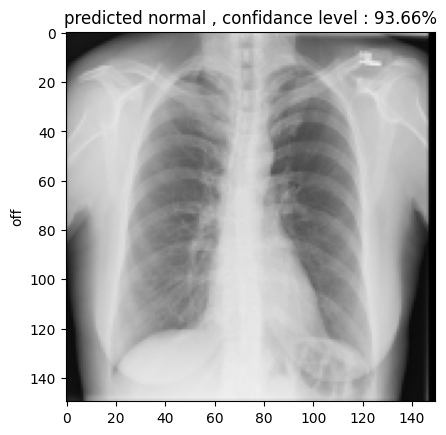

Image: /kaggle/input/covid19-radiography-database/COVID-19_Radiography_Dataset/Normal/images/Normal-6062.png
Predicted Class: normal, Confidence: 93.66%

1/1 [==============================] - 0s 32ms/step


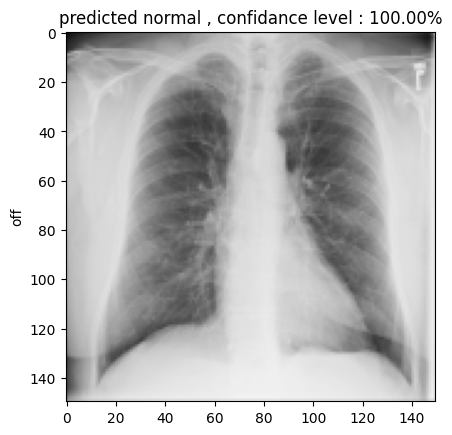

Image: /kaggle/input/covid19-radiography-database/COVID-19_Radiography_Dataset/Normal/images/Normal-9875.png
Predicted Class: normal, Confidence: 100.00%

1/1 [==============================] - 0s 34ms/step


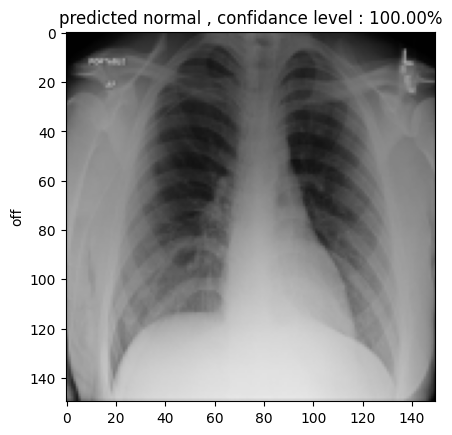

Image: /kaggle/input/covid19-radiography-database/COVID-19_Radiography_Dataset/Normal/images/Normal-6533.png
Predicted Class: normal, Confidence: 100.00%

1/1 [==============================] - 0s 32ms/step


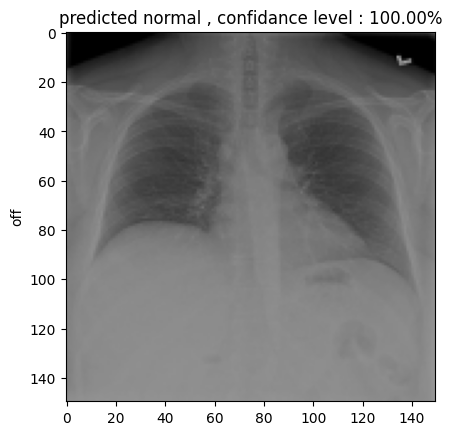

Image: /kaggle/input/covid19-radiography-database/COVID-19_Radiography_Dataset/Normal/images/Normal-7711.png
Predicted Class: normal, Confidence: 100.00%

1/1 [==============================] - 0s 31ms/step


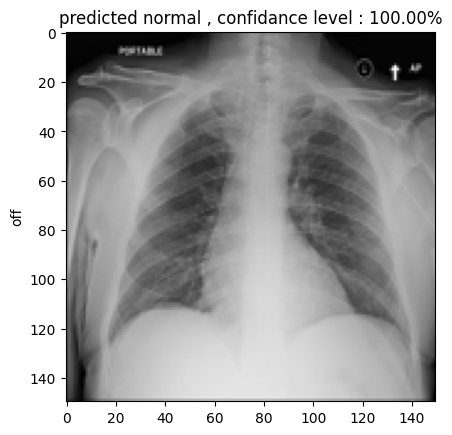

Image: /kaggle/input/covid19-radiography-database/COVID-19_Radiography_Dataset/Normal/images/Normal-4115.png
Predicted Class: normal, Confidence: 100.00%

1/1 [==============================] - 0s 32ms/step


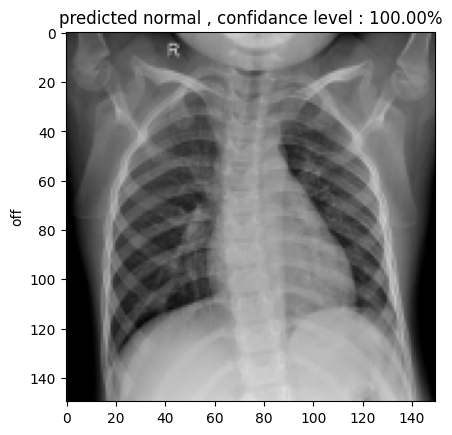

Image: /kaggle/input/covid19-radiography-database/COVID-19_Radiography_Dataset/Normal/images/Normal-319.png
Predicted Class: normal, Confidence: 100.00%

1/1 [==============================] - 0s 33ms/step


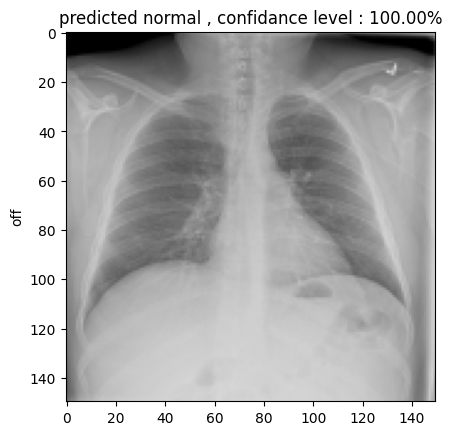

Image: /kaggle/input/covid19-radiography-database/COVID-19_Radiography_Dataset/Normal/images/Normal-2185.png
Predicted Class: normal, Confidence: 100.00%

1/1 [==============================] - 0s 32ms/step


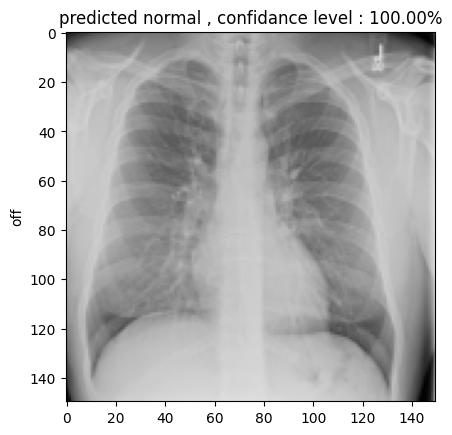

Image: /kaggle/input/covid19-radiography-database/COVID-19_Radiography_Dataset/Normal/images/Normal-7336.png
Predicted Class: normal, Confidence: 100.00%

1/1 [==============================] - 0s 32ms/step


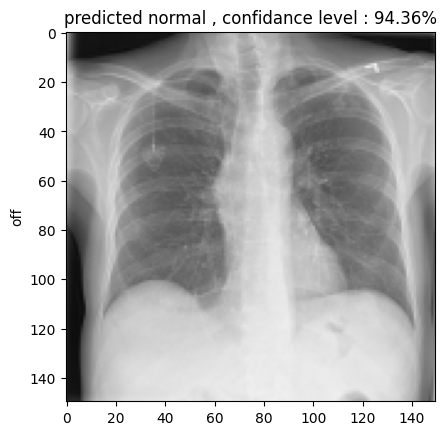

Image: /kaggle/input/covid19-radiography-database/COVID-19_Radiography_Dataset/Normal/images/Normal-2706.png
Predicted Class: normal, Confidence: 94.36%

1/1 [==============================] - 0s 32ms/step


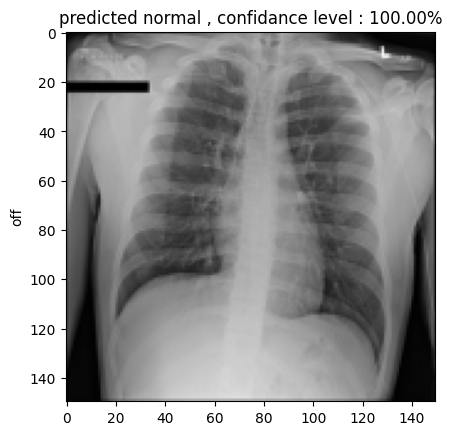

Image: /kaggle/input/covid19-radiography-database/COVID-19_Radiography_Dataset/Normal/images/Normal-9043.png
Predicted Class: normal, Confidence: 100.00%

1/1 [==============================] - 0s 32ms/step


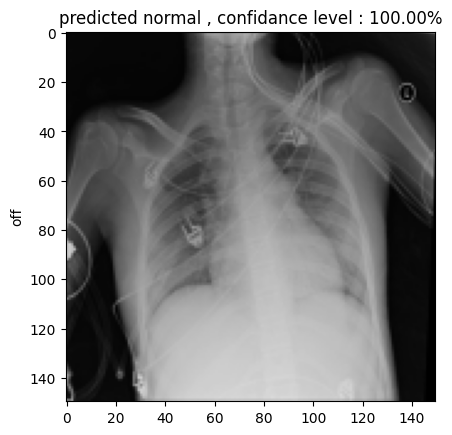

Image: /kaggle/input/covid19-radiography-database/COVID-19_Radiography_Dataset/Normal/images/Normal-1932.png
Predicted Class: normal, Confidence: 100.00%

1/1 [==============================] - 0s 34ms/step


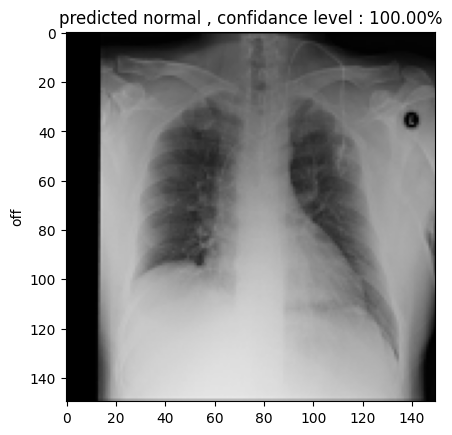

Image: /kaggle/input/covid19-radiography-database/COVID-19_Radiography_Dataset/Normal/images/Normal-3707.png
Predicted Class: normal, Confidence: 100.00%

1/1 [==============================] - 0s 32ms/step


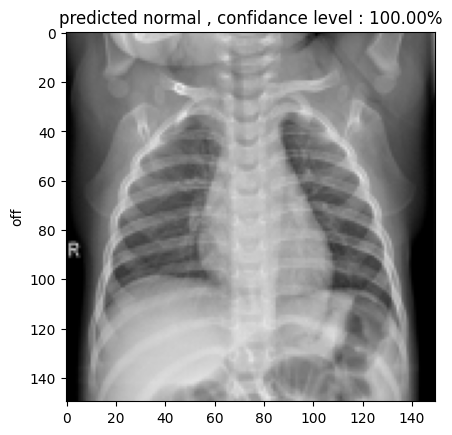

Image: /kaggle/input/covid19-radiography-database/COVID-19_Radiography_Dataset/Normal/images/Normal-1088.png
Predicted Class: normal, Confidence: 100.00%

1/1 [==============================] - 0s 32ms/step


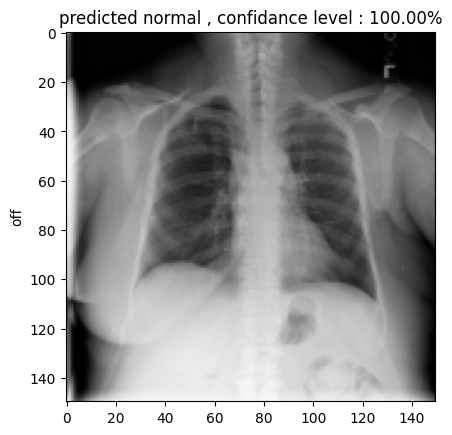

Image: /kaggle/input/covid19-radiography-database/COVID-19_Radiography_Dataset/Normal/images/Normal-1496.png
Predicted Class: normal, Confidence: 100.00%

1/1 [==============================] - 0s 31ms/step


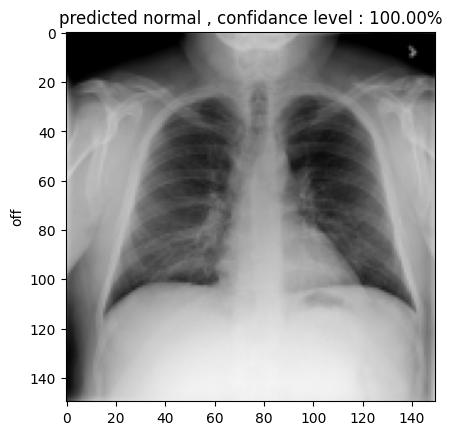

Image: /kaggle/input/covid19-radiography-database/COVID-19_Radiography_Dataset/Normal/images/Normal-2750.png
Predicted Class: normal, Confidence: 100.00%

1/1 [==============================] - 0s 31ms/step


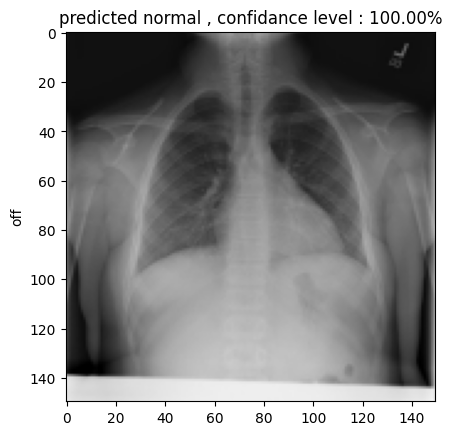

Image: /kaggle/input/covid19-radiography-database/COVID-19_Radiography_Dataset/Normal/images/Normal-4952.png
Predicted Class: normal, Confidence: 100.00%

1/1 [==============================] - 0s 33ms/step


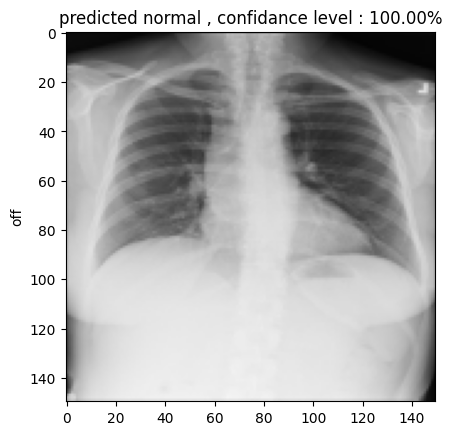

Image: /kaggle/input/covid19-radiography-database/COVID-19_Radiography_Dataset/Normal/images/Normal-2585.png
Predicted Class: normal, Confidence: 100.00%

1/1 [==============================] - 0s 32ms/step


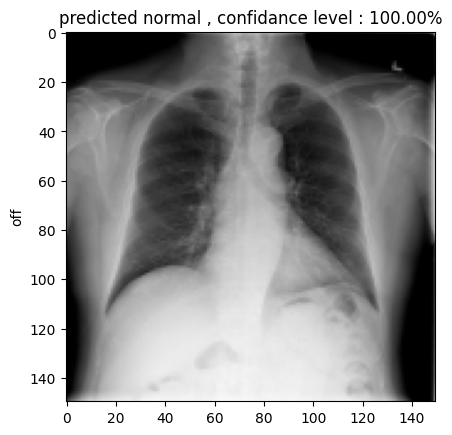

Image: /kaggle/input/covid19-radiography-database/COVID-19_Radiography_Dataset/Normal/images/Normal-8781.png
Predicted Class: normal, Confidence: 100.00%

1/1 [==============================] - 0s 33ms/step


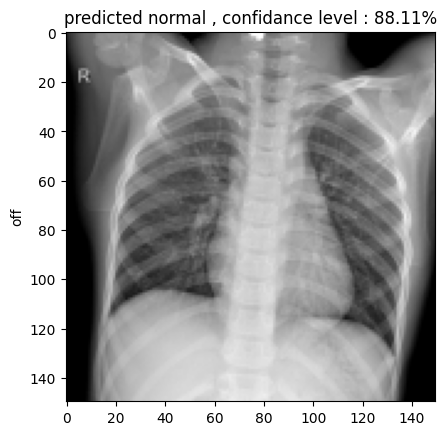

Image: /kaggle/input/covid19-radiography-database/COVID-19_Radiography_Dataset/Normal/images/Normal-677.png
Predicted Class: normal, Confidence: 88.11%

1/1 [==============================] - 0s 31ms/step


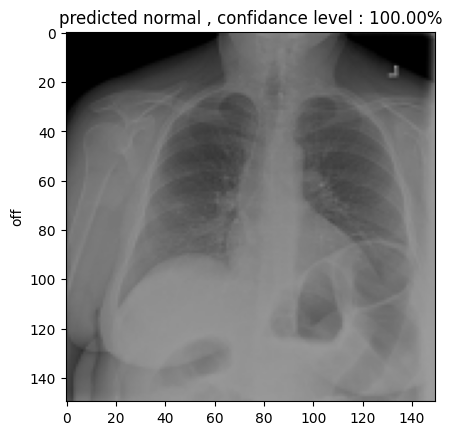

Image: /kaggle/input/covid19-radiography-database/COVID-19_Radiography_Dataset/Normal/images/Normal-9752.png
Predicted Class: normal, Confidence: 100.00%

1/1 [==============================] - 0s 32ms/step


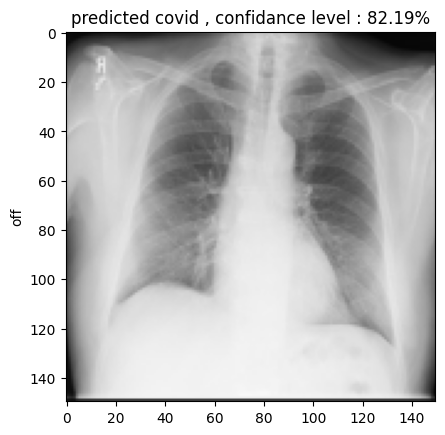

Image: /kaggle/input/covid19-radiography-database/COVID-19_Radiography_Dataset/Normal/images/Normal-8488.png
Predicted Class: covid, Confidence: 82.19%

1/1 [==============================] - 0s 41ms/step


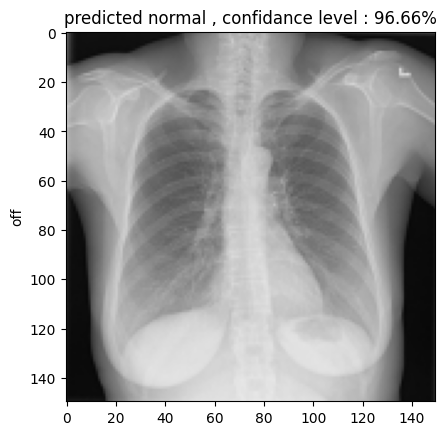

Image: /kaggle/input/covid19-radiography-database/COVID-19_Radiography_Dataset/Normal/images/Normal-6878.png
Predicted Class: normal, Confidence: 96.66%

1/1 [==============================] - 0s 34ms/step


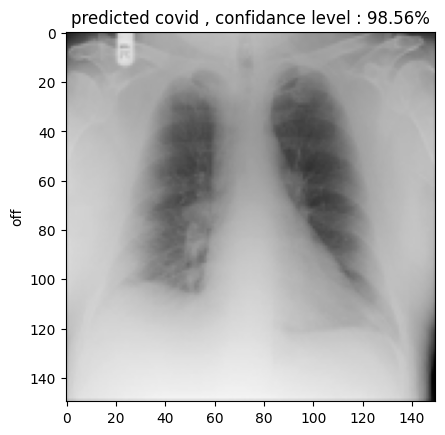

Image: /kaggle/input/covid19-radiography-database/COVID-19_Radiography_Dataset/Normal/images/Normal-8770.png
Predicted Class: covid, Confidence: 98.56%

1/1 [==============================] - 0s 33ms/step


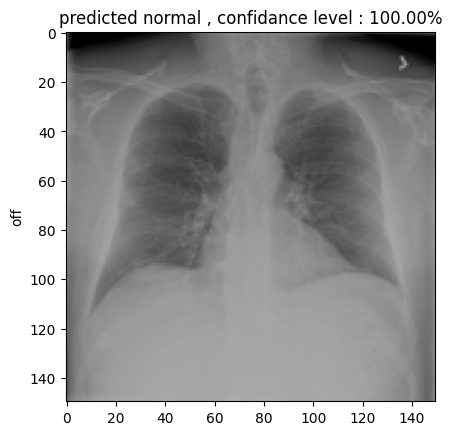

Image: /kaggle/input/covid19-radiography-database/COVID-19_Radiography_Dataset/Normal/images/Normal-6131.png
Predicted Class: normal, Confidence: 100.00%

1/1 [==============================] - 0s 31ms/step


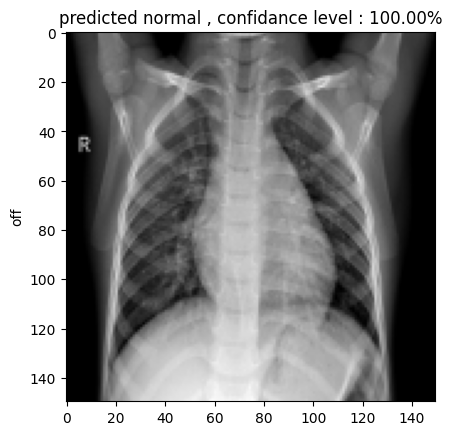

Image: /kaggle/input/covid19-radiography-database/COVID-19_Radiography_Dataset/Normal/images/Normal-660.png
Predicted Class: normal, Confidence: 100.00%

1/1 [==============================] - 0s 32ms/step


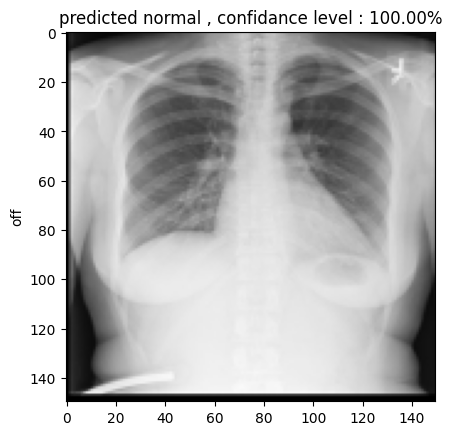

Image: /kaggle/input/covid19-radiography-database/COVID-19_Radiography_Dataset/Normal/images/Normal-7816.png
Predicted Class: normal, Confidence: 100.00%

1/1 [==============================] - 0s 32ms/step


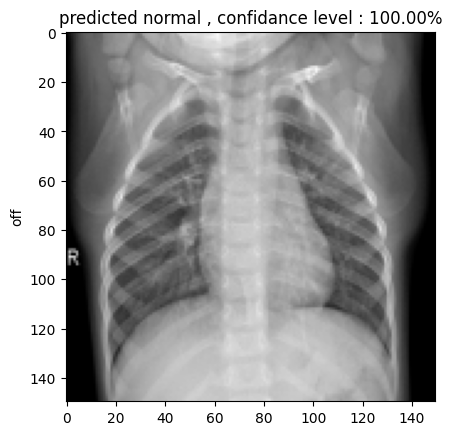

Image: /kaggle/input/covid19-radiography-database/COVID-19_Radiography_Dataset/Normal/images/Normal-1340.png
Predicted Class: normal, Confidence: 100.00%

1/1 [==============================] - 0s 33ms/step


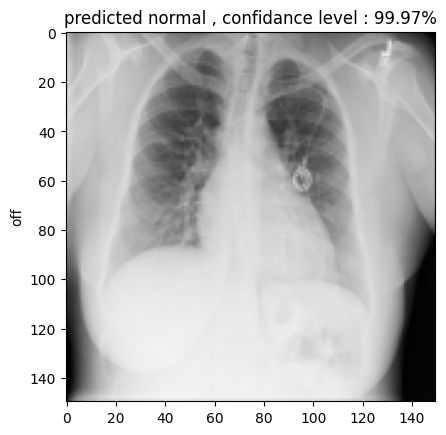

Image: /kaggle/input/covid19-radiography-database/COVID-19_Radiography_Dataset/Normal/images/Normal-7136.png
Predicted Class: normal, Confidence: 99.97%

1/1 [==============================] - 0s 30ms/step


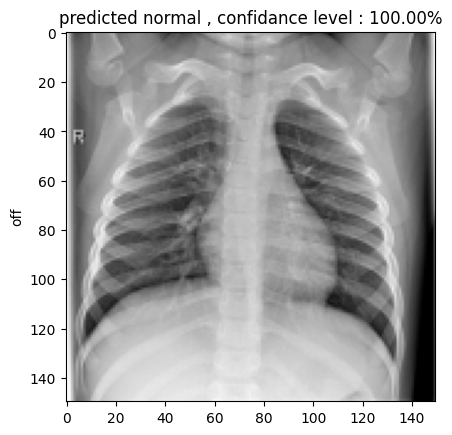

Image: /kaggle/input/covid19-radiography-database/COVID-19_Radiography_Dataset/Normal/images/Normal-873.png
Predicted Class: normal, Confidence: 100.00%

1/1 [==============================] - 0s 33ms/step


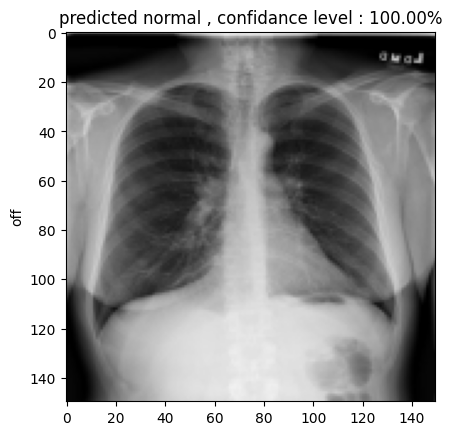

Image: /kaggle/input/covid19-radiography-database/COVID-19_Radiography_Dataset/Normal/images/Normal-7734.png
Predicted Class: normal, Confidence: 100.00%

1/1 [==============================] - 0s 31ms/step


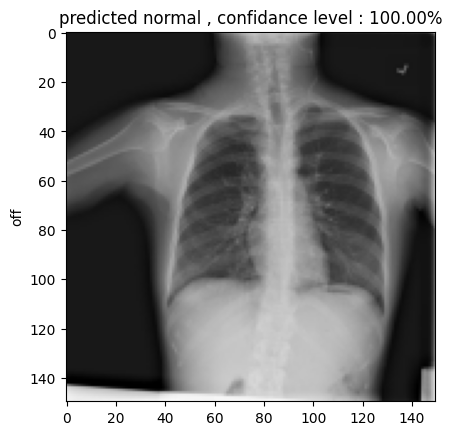

Image: /kaggle/input/covid19-radiography-database/COVID-19_Radiography_Dataset/Normal/images/Normal-5391.png
Predicted Class: normal, Confidence: 100.00%

1/1 [==============================] - 0s 35ms/step


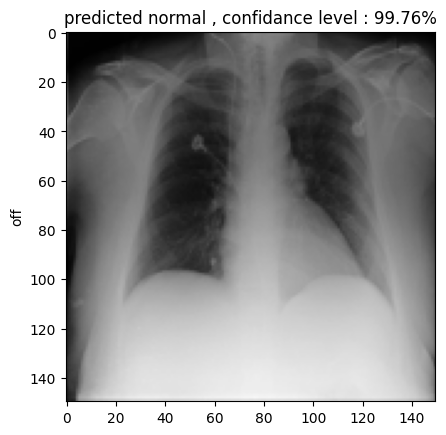

Image: /kaggle/input/covid19-radiography-database/COVID-19_Radiography_Dataset/Normal/images/Normal-8774.png
Predicted Class: normal, Confidence: 99.76%

1/1 [==============================] - 0s 32ms/step


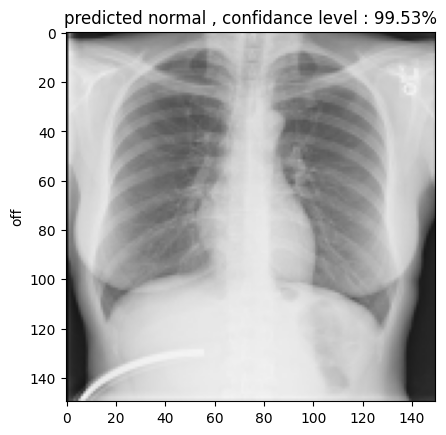

Image: /kaggle/input/covid19-radiography-database/COVID-19_Radiography_Dataset/Normal/images/Normal-8862.png
Predicted Class: normal, Confidence: 99.53%

1/1 [==============================] - 0s 31ms/step


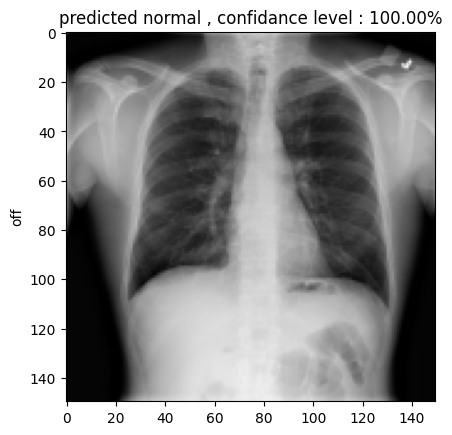

Image: /kaggle/input/covid19-radiography-database/COVID-19_Radiography_Dataset/Normal/images/Normal-4689.png
Predicted Class: normal, Confidence: 100.00%

1/1 [==============================] - 0s 31ms/step


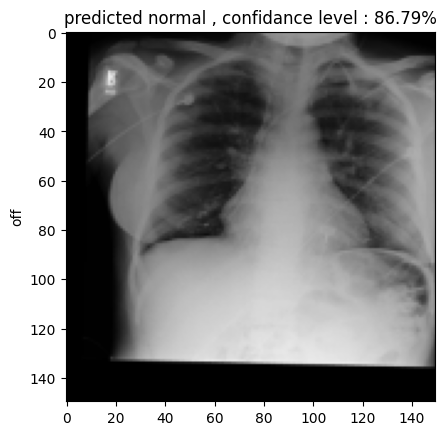

Image: /kaggle/input/covid19-radiography-database/COVID-19_Radiography_Dataset/Normal/images/Normal-3621.png
Predicted Class: normal, Confidence: 86.79%

1/1 [==============================] - 0s 31ms/step


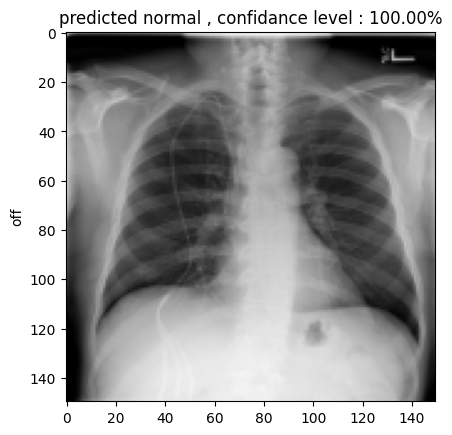

Image: /kaggle/input/covid19-radiography-database/COVID-19_Radiography_Dataset/Normal/images/Normal-3608.png
Predicted Class: normal, Confidence: 100.00%

1/1 [==============================] - 0s 33ms/step


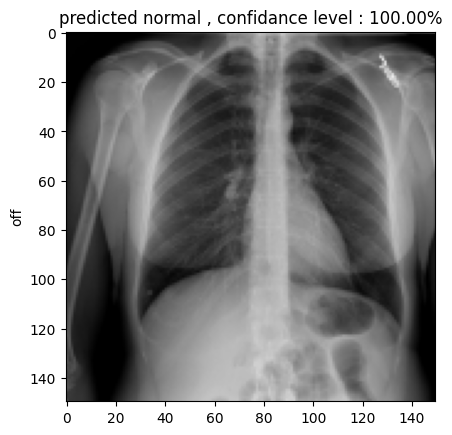

Image: /kaggle/input/covid19-radiography-database/COVID-19_Radiography_Dataset/Normal/images/Normal-8174.png
Predicted Class: normal, Confidence: 100.00%

1/1 [==============================] - 0s 32ms/step


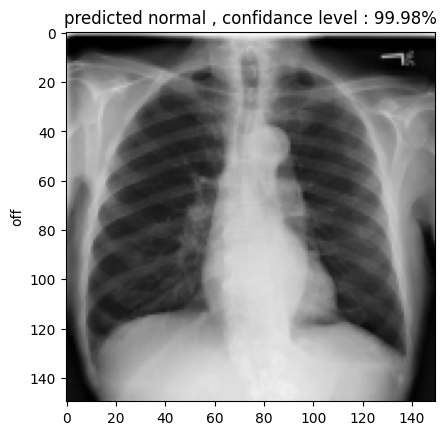

Image: /kaggle/input/covid19-radiography-database/COVID-19_Radiography_Dataset/Normal/images/Normal-6080.png
Predicted Class: normal, Confidence: 99.98%

1/1 [==============================] - 0s 33ms/step


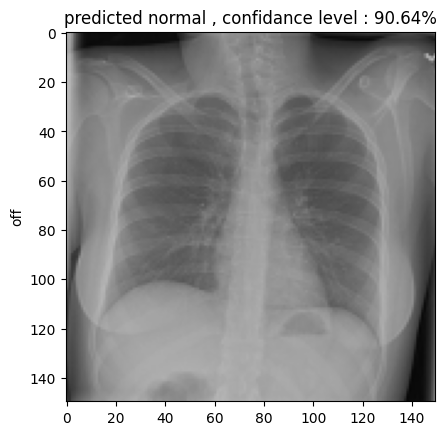

Image: /kaggle/input/covid19-radiography-database/COVID-19_Radiography_Dataset/Normal/images/Normal-9072.png
Predicted Class: normal, Confidence: 90.64%

1/1 [==============================] - 0s 35ms/step


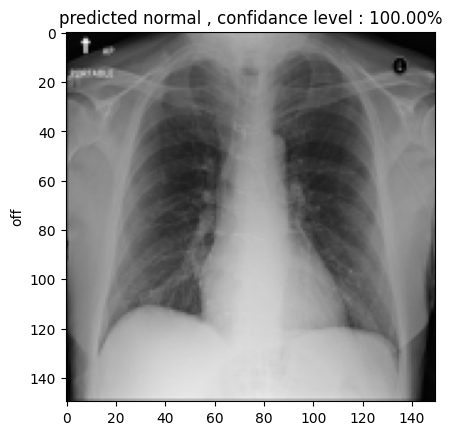

Image: /kaggle/input/covid19-radiography-database/COVID-19_Radiography_Dataset/Normal/images/Normal-6291.png
Predicted Class: normal, Confidence: 100.00%

1/1 [==============================] - 0s 32ms/step


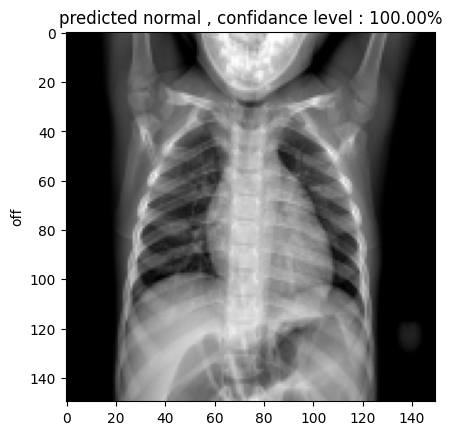

Image: /kaggle/input/covid19-radiography-database/COVID-19_Radiography_Dataset/Normal/images/Normal-94.png
Predicted Class: normal, Confidence: 100.00%

1/1 [==============================] - 0s 32ms/step


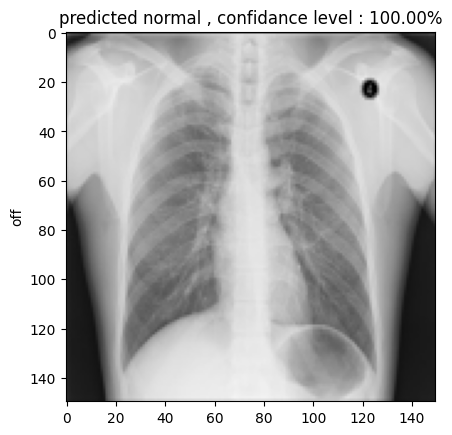

Image: /kaggle/input/covid19-radiography-database/COVID-19_Radiography_Dataset/Normal/images/Normal-10187.png
Predicted Class: normal, Confidence: 100.00%

1/1 [==============================] - 0s 32ms/step


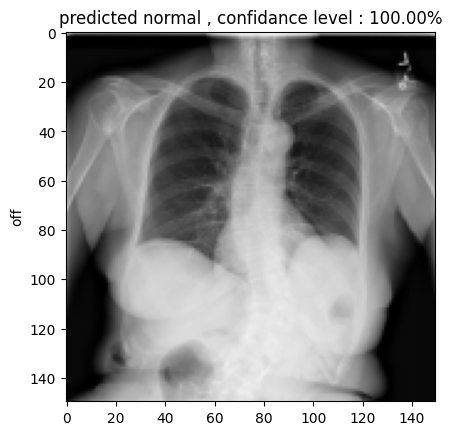

Image: /kaggle/input/covid19-radiography-database/COVID-19_Radiography_Dataset/Normal/images/Normal-7004.png
Predicted Class: normal, Confidence: 100.00%

1/1 [==============================] - 0s 32ms/step


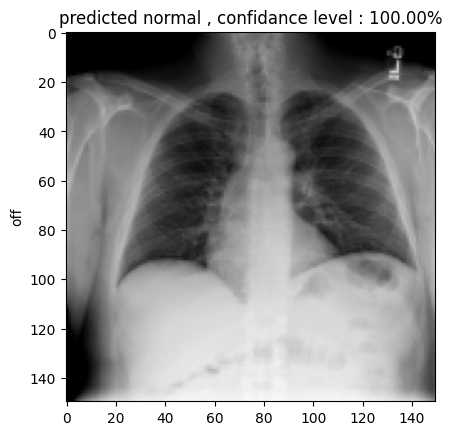

Image: /kaggle/input/covid19-radiography-database/COVID-19_Radiography_Dataset/Normal/images/Normal-9554.png
Predicted Class: normal, Confidence: 100.00%

1/1 [==============================] - 0s 35ms/step


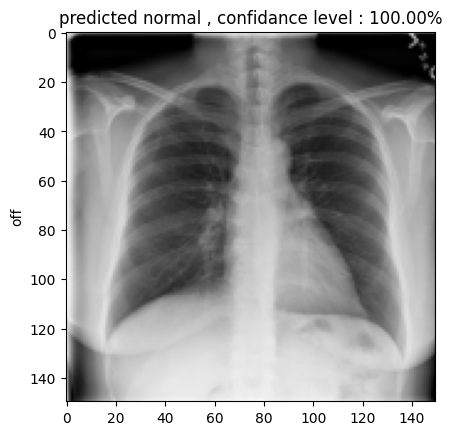

Image: /kaggle/input/covid19-radiography-database/COVID-19_Radiography_Dataset/Normal/images/Normal-1698.png
Predicted Class: normal, Confidence: 100.00%

1/1 [==============================] - 0s 33ms/step


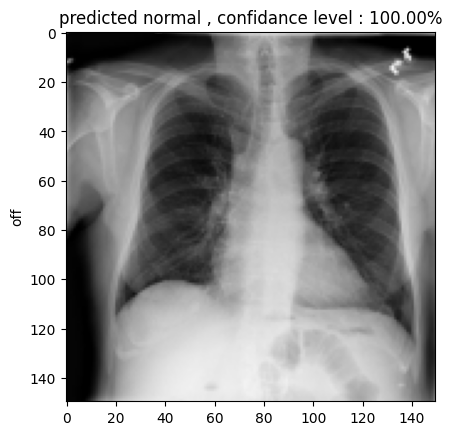

Image: /kaggle/input/covid19-radiography-database/COVID-19_Radiography_Dataset/Normal/images/Normal-2734.png
Predicted Class: normal, Confidence: 100.00%

1/1 [==============================] - 0s 34ms/step


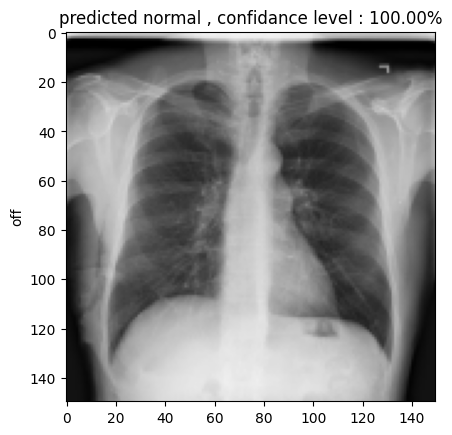

Image: /kaggle/input/covid19-radiography-database/COVID-19_Radiography_Dataset/Normal/images/Normal-3036.png
Predicted Class: normal, Confidence: 100.00%

1/1 [==============================] - 0s 34ms/step


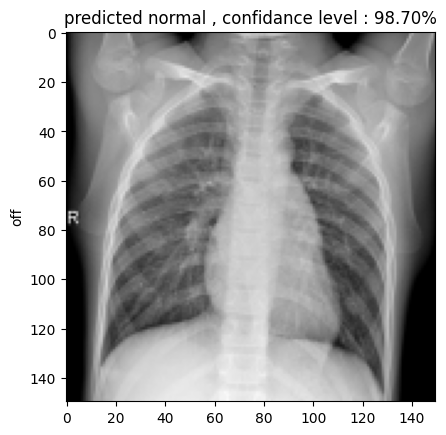

Image: /kaggle/input/covid19-radiography-database/COVID-19_Radiography_Dataset/Normal/images/Normal-892.png
Predicted Class: normal, Confidence: 98.70%

1/1 [==============================] - 0s 33ms/step


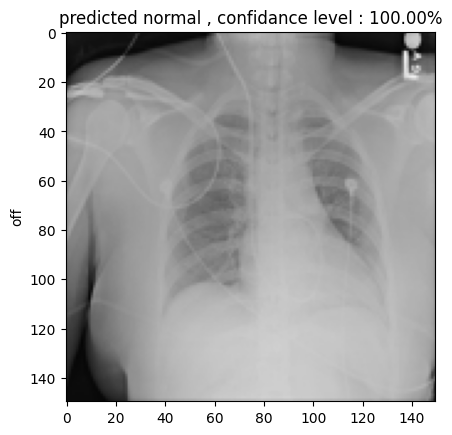

Image: /kaggle/input/covid19-radiography-database/COVID-19_Radiography_Dataset/Normal/images/Normal-8652.png
Predicted Class: normal, Confidence: 100.00%

1/1 [==============================] - 0s 33ms/step


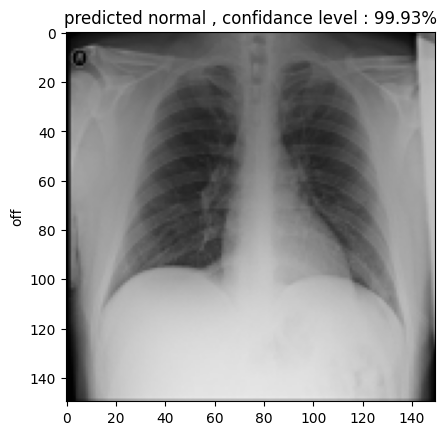

Image: /kaggle/input/covid19-radiography-database/COVID-19_Radiography_Dataset/Normal/images/Normal-3392.png
Predicted Class: normal, Confidence: 99.93%

1/1 [==============================] - 0s 33ms/step


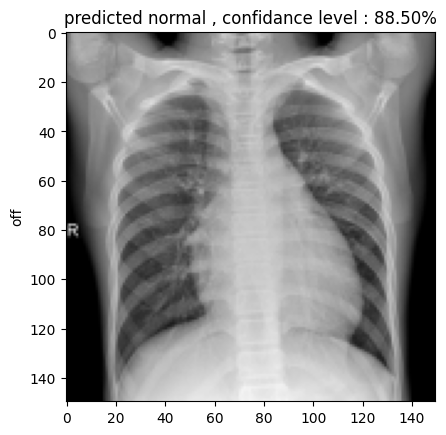

Image: /kaggle/input/covid19-radiography-database/COVID-19_Radiography_Dataset/Normal/images/Normal-922.png
Predicted Class: normal, Confidence: 88.50%

1/1 [==============================] - 0s 32ms/step


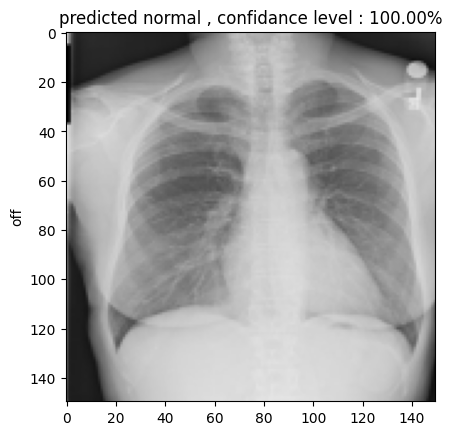

Image: /kaggle/input/covid19-radiography-database/COVID-19_Radiography_Dataset/Normal/images/Normal-8632.png
Predicted Class: normal, Confidence: 100.00%

1/1 [==============================] - 0s 34ms/step


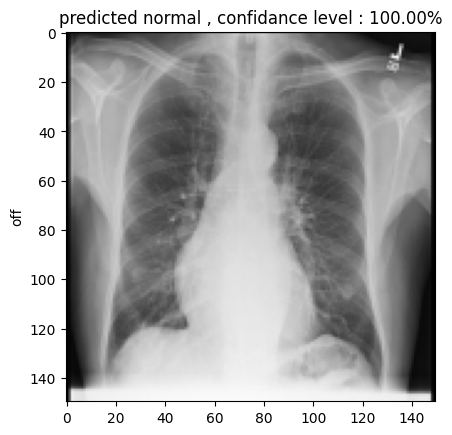

Image: /kaggle/input/covid19-radiography-database/COVID-19_Radiography_Dataset/Normal/images/Normal-8191.png
Predicted Class: normal, Confidence: 100.00%

1/1 [==============================] - 0s 33ms/step


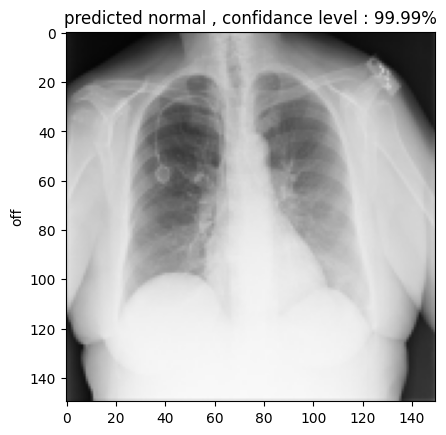

Image: /kaggle/input/covid19-radiography-database/COVID-19_Radiography_Dataset/Normal/images/Normal-3753.png
Predicted Class: normal, Confidence: 99.99%

1/1 [==============================] - 0s 33ms/step


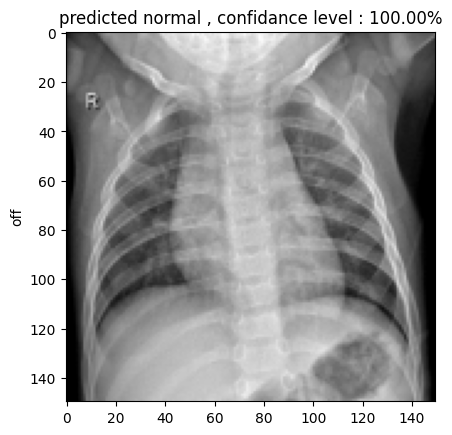

Image: /kaggle/input/covid19-radiography-database/COVID-19_Radiography_Dataset/Normal/images/Normal-1095.png
Predicted Class: normal, Confidence: 100.00%

1/1 [==============================] - 0s 33ms/step


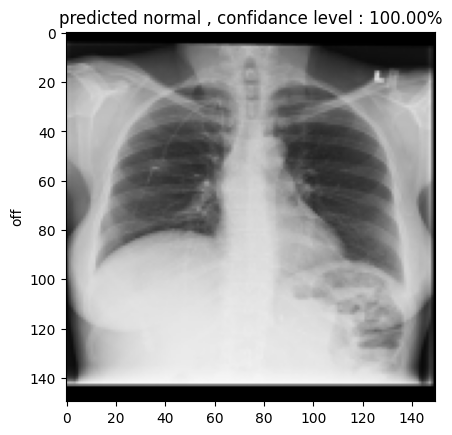

Image: /kaggle/input/covid19-radiography-database/COVID-19_Radiography_Dataset/Normal/images/Normal-5479.png
Predicted Class: normal, Confidence: 100.00%

1/1 [==============================] - 0s 33ms/step


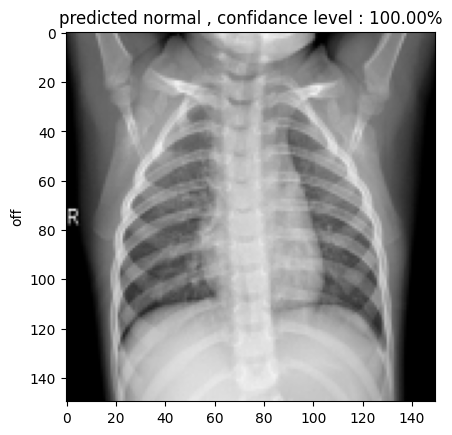

Image: /kaggle/input/covid19-radiography-database/COVID-19_Radiography_Dataset/Normal/images/Normal-1165.png
Predicted Class: normal, Confidence: 100.00%

1/1 [==============================] - 0s 32ms/step


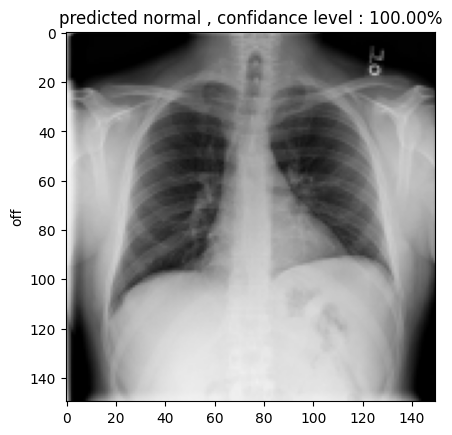

Image: /kaggle/input/covid19-radiography-database/COVID-19_Radiography_Dataset/Normal/images/Normal-3541.png
Predicted Class: normal, Confidence: 100.00%

1/1 [==============================] - 0s 33ms/step


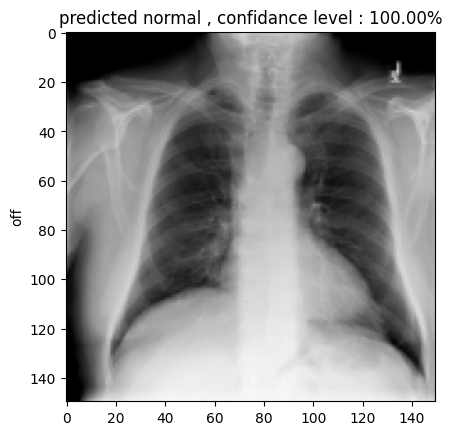

Image: /kaggle/input/covid19-radiography-database/COVID-19_Radiography_Dataset/Normal/images/Normal-1794.png
Predicted Class: normal, Confidence: 100.00%

1/1 [==============================] - 0s 34ms/step


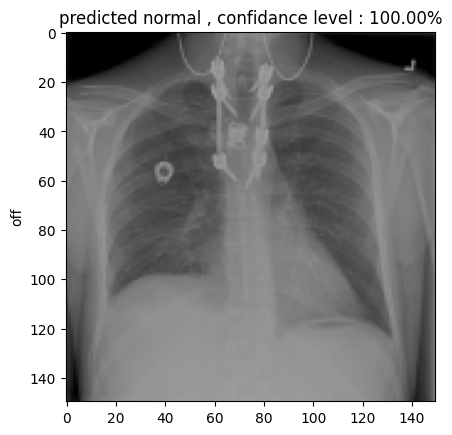

Image: /kaggle/input/covid19-radiography-database/COVID-19_Radiography_Dataset/Normal/images/Normal-7692.png
Predicted Class: normal, Confidence: 100.00%

1/1 [==============================] - 0s 32ms/step


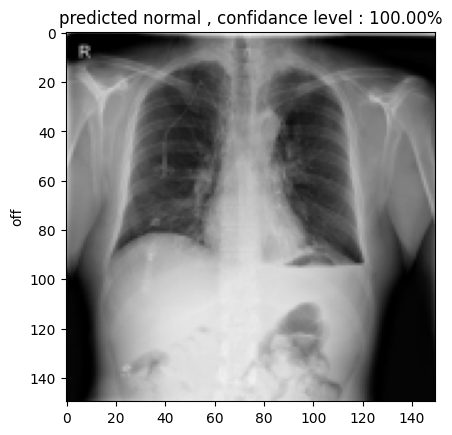

Image: /kaggle/input/covid19-radiography-database/COVID-19_Radiography_Dataset/Normal/images/Normal-9980.png
Predicted Class: normal, Confidence: 100.00%

1/1 [==============================] - 0s 32ms/step


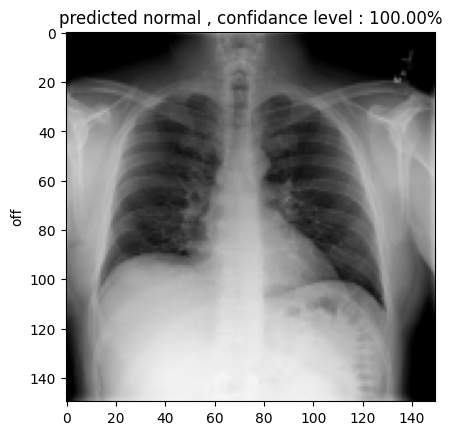

Image: /kaggle/input/covid19-radiography-database/COVID-19_Radiography_Dataset/Normal/images/Normal-9515.png
Predicted Class: normal, Confidence: 100.00%

1/1 [==============================] - 0s 34ms/step


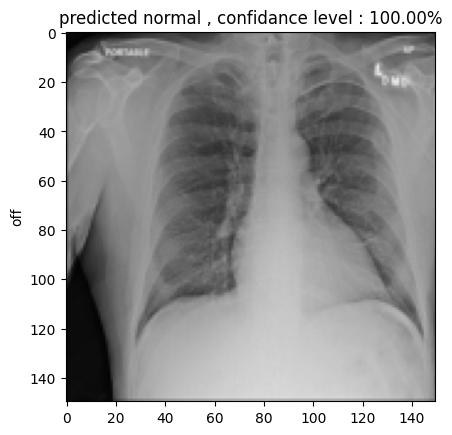

Image: /kaggle/input/covid19-radiography-database/COVID-19_Radiography_Dataset/Normal/images/Normal-6784.png
Predicted Class: normal, Confidence: 100.00%

1/1 [==============================] - 0s 33ms/step


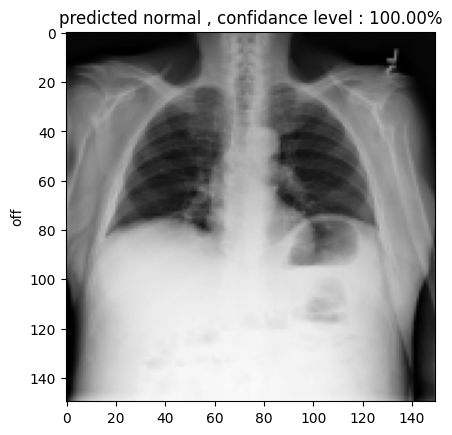

Image: /kaggle/input/covid19-radiography-database/COVID-19_Radiography_Dataset/Normal/images/Normal-4970.png
Predicted Class: normal, Confidence: 100.00%

1/1 [==============================] - 0s 33ms/step


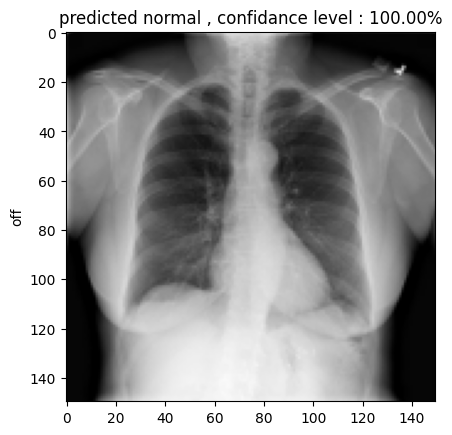

Image: /kaggle/input/covid19-radiography-database/COVID-19_Radiography_Dataset/Normal/images/Normal-6065.png
Predicted Class: normal, Confidence: 100.00%

1/1 [==============================] - 0s 32ms/step


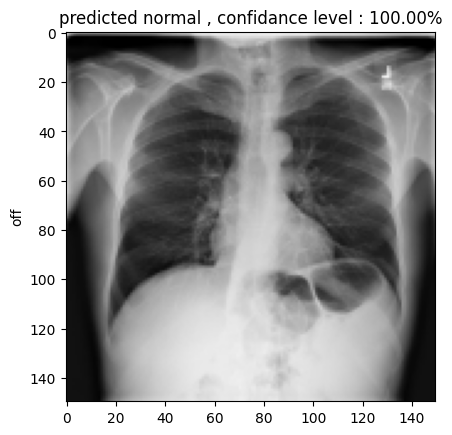

Image: /kaggle/input/covid19-radiography-database/COVID-19_Radiography_Dataset/Normal/images/Normal-9186.png
Predicted Class: normal, Confidence: 100.00%

1/1 [==============================] - 0s 33ms/step


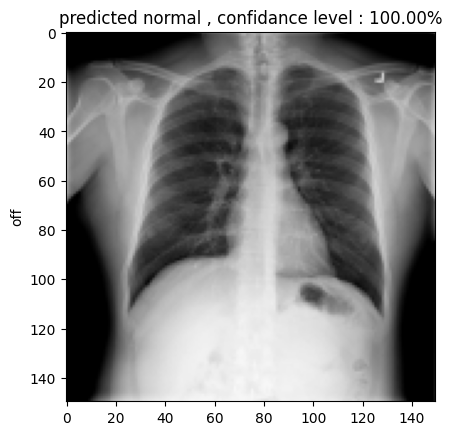

Image: /kaggle/input/covid19-radiography-database/COVID-19_Radiography_Dataset/Normal/images/Normal-6231.png
Predicted Class: normal, Confidence: 100.00%

1/1 [==============================] - 0s 34ms/step


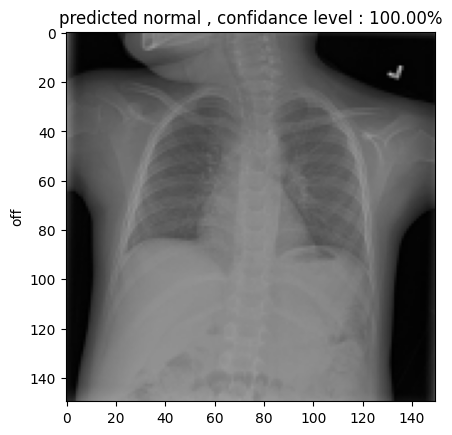

Image: /kaggle/input/covid19-radiography-database/COVID-19_Radiography_Dataset/Normal/images/Normal-4778.png
Predicted Class: normal, Confidence: 100.00%

1/1 [==============================] - 0s 33ms/step


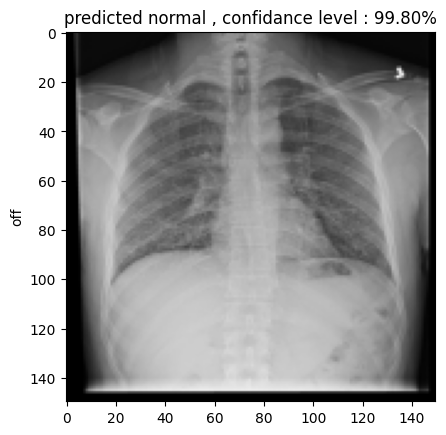

Image: /kaggle/input/covid19-radiography-database/COVID-19_Radiography_Dataset/Normal/images/Normal-9027.png
Predicted Class: normal, Confidence: 99.80%

1/1 [==============================] - 0s 34ms/step


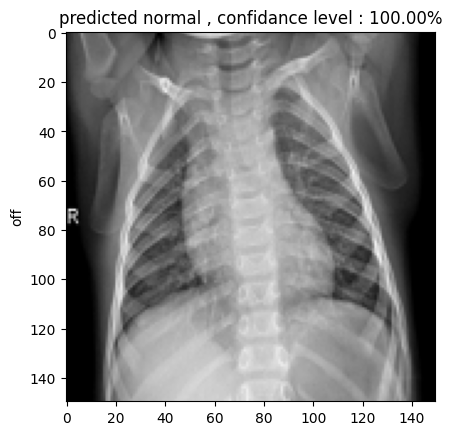

Image: /kaggle/input/covid19-radiography-database/COVID-19_Radiography_Dataset/Normal/images/Normal-1272.png
Predicted Class: normal, Confidence: 100.00%

1/1 [==============================] - 0s 32ms/step


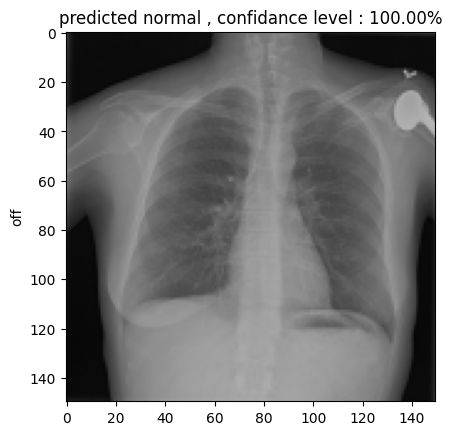

Image: /kaggle/input/covid19-radiography-database/COVID-19_Radiography_Dataset/Normal/images/Normal-4049.png
Predicted Class: normal, Confidence: 100.00%

1/1 [==============================] - 0s 32ms/step


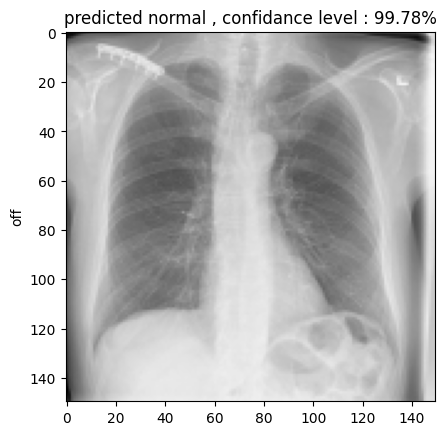

Image: /kaggle/input/covid19-radiography-database/COVID-19_Radiography_Dataset/Normal/images/Normal-5164.png
Predicted Class: normal, Confidence: 99.78%

1/1 [==============================] - 0s 33ms/step


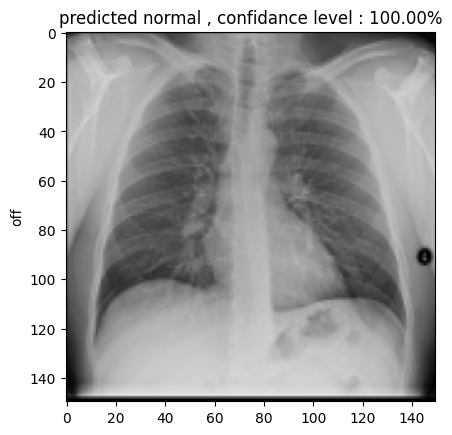

Image: /kaggle/input/covid19-radiography-database/COVID-19_Radiography_Dataset/Normal/images/Normal-8646.png
Predicted Class: normal, Confidence: 100.00%

1/1 [==============================] - 0s 32ms/step


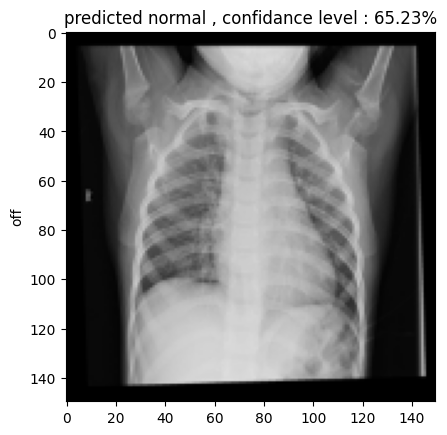

Image: /kaggle/input/covid19-radiography-database/COVID-19_Radiography_Dataset/Normal/images/Normal-924.png
Predicted Class: normal, Confidence: 65.23%

1/1 [==============================] - 0s 31ms/step


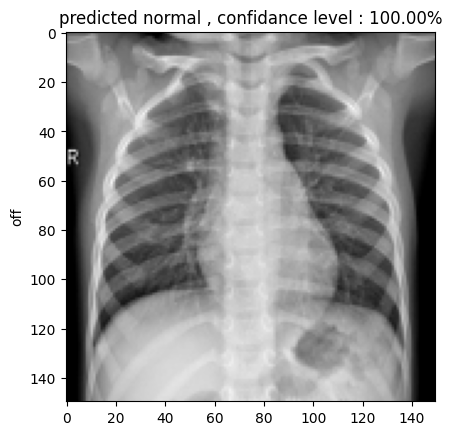

Image: /kaggle/input/covid19-radiography-database/COVID-19_Radiography_Dataset/Normal/images/Normal-663.png
Predicted Class: normal, Confidence: 100.00%

1/1 [==============================] - 0s 33ms/step


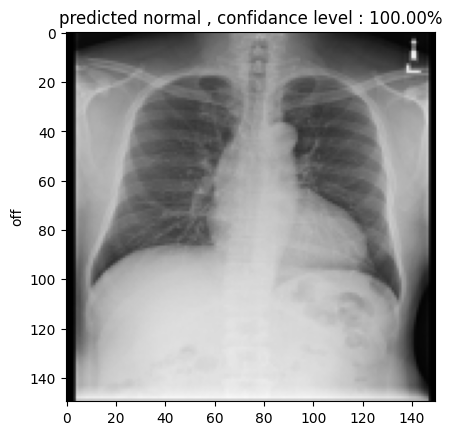

Image: /kaggle/input/covid19-radiography-database/COVID-19_Radiography_Dataset/Normal/images/Normal-8684.png
Predicted Class: normal, Confidence: 100.00%

1/1 [==============================] - 0s 31ms/step


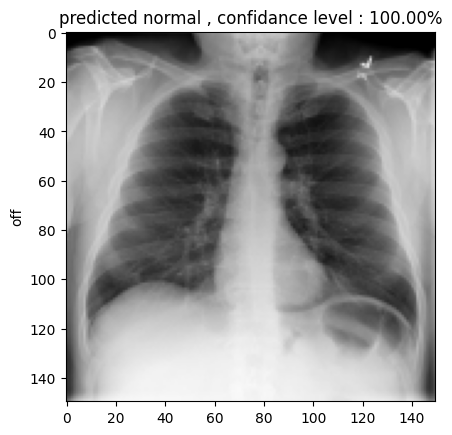

Image: /kaggle/input/covid19-radiography-database/COVID-19_Radiography_Dataset/Normal/images/Normal-2411.png
Predicted Class: normal, Confidence: 100.00%

1/1 [==============================] - 0s 34ms/step


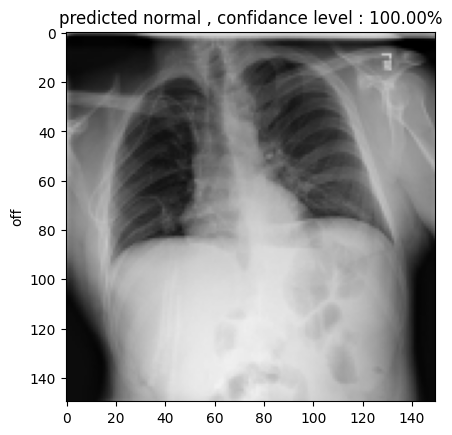

Image: /kaggle/input/covid19-radiography-database/COVID-19_Radiography_Dataset/Normal/images/Normal-2142.png
Predicted Class: normal, Confidence: 100.00%

1/1 [==============================] - 0s 32ms/step


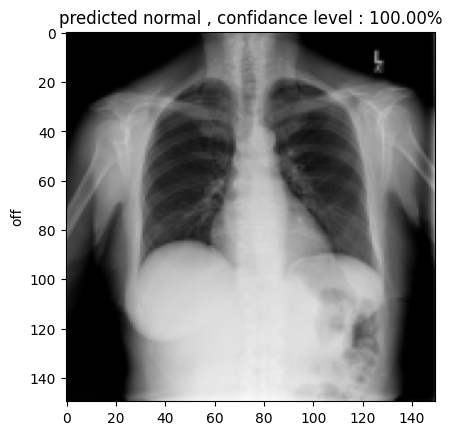

Image: /kaggle/input/covid19-radiography-database/COVID-19_Radiography_Dataset/Normal/images/Normal-6537.png
Predicted Class: normal, Confidence: 100.00%

1/1 [==============================] - 0s 32ms/step


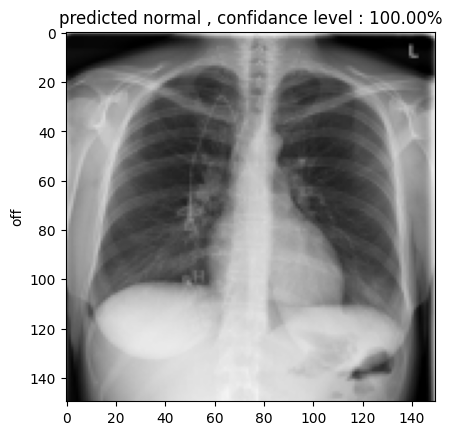

Image: /kaggle/input/covid19-radiography-database/COVID-19_Radiography_Dataset/Normal/images/Normal-5870.png
Predicted Class: normal, Confidence: 100.00%

1/1 [==============================] - 0s 32ms/step


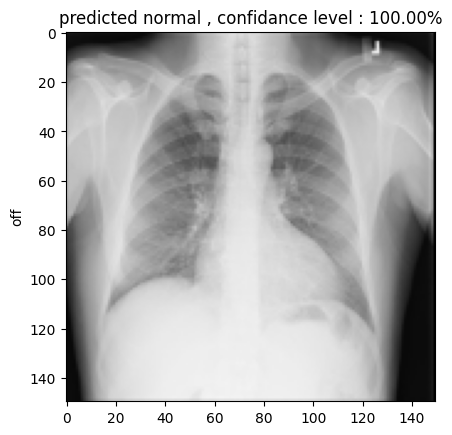

Image: /kaggle/input/covid19-radiography-database/COVID-19_Radiography_Dataset/Normal/images/Normal-6868.png
Predicted Class: normal, Confidence: 100.00%

1/1 [==============================] - 0s 33ms/step


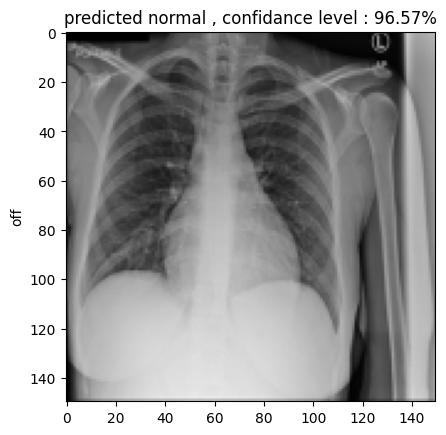

Image: /kaggle/input/covid19-radiography-database/COVID-19_Radiography_Dataset/Normal/images/Normal-3683.png
Predicted Class: normal, Confidence: 96.57%

1/1 [==============================] - 0s 41ms/step


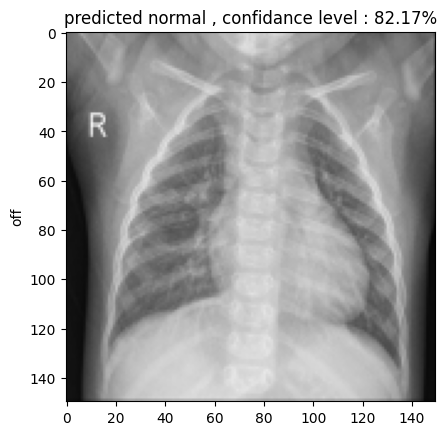

Image: /kaggle/input/covid19-radiography-database/COVID-19_Radiography_Dataset/Normal/images/Normal-1291.png
Predicted Class: normal, Confidence: 82.17%

1/1 [==============================] - 0s 32ms/step


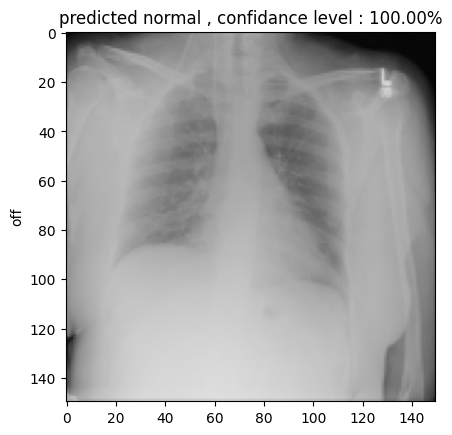

Image: /kaggle/input/covid19-radiography-database/COVID-19_Radiography_Dataset/Normal/images/Normal-7338.png
Predicted Class: normal, Confidence: 100.00%

1/1 [==============================] - 0s 31ms/step


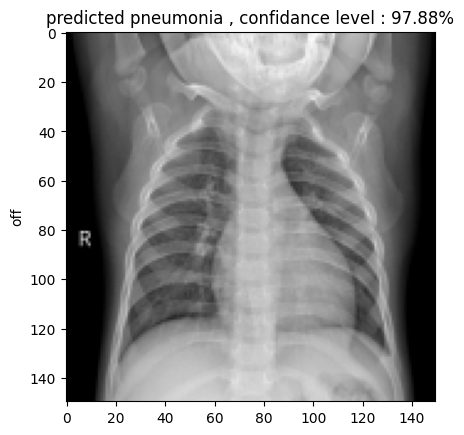

Image: /kaggle/input/covid19-radiography-database/COVID-19_Radiography_Dataset/Normal/images/Normal-517.png
Predicted Class: pneumonia, Confidence: 97.88%

1/1 [==============================] - 0s 31ms/step


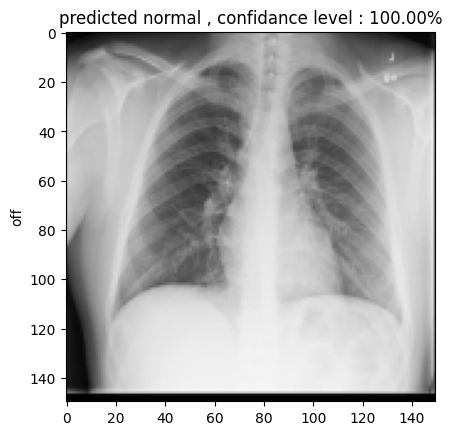

Image: /kaggle/input/covid19-radiography-database/COVID-19_Radiography_Dataset/Normal/images/Normal-1428.png
Predicted Class: normal, Confidence: 100.00%

1/1 [==============================] - 0s 31ms/step


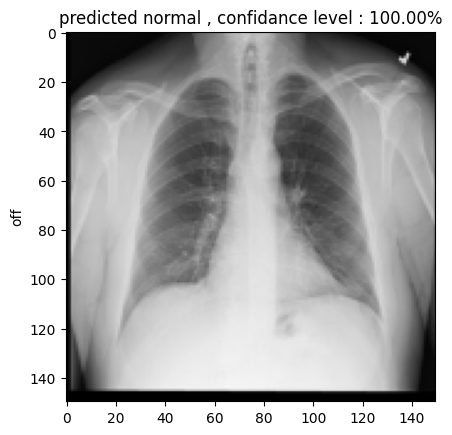

Image: /kaggle/input/covid19-radiography-database/COVID-19_Radiography_Dataset/Normal/images/Normal-6621.png
Predicted Class: normal, Confidence: 100.00%

1/1 [==============================] - 0s 34ms/step


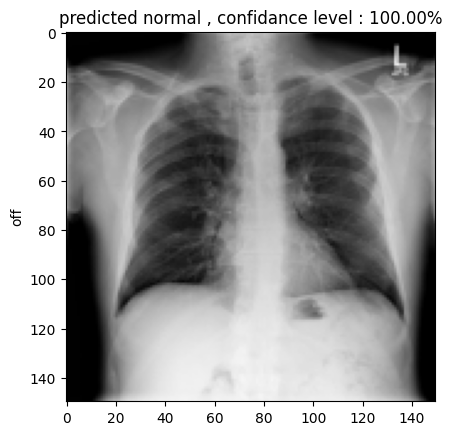

Image: /kaggle/input/covid19-radiography-database/COVID-19_Radiography_Dataset/Normal/images/Normal-61.png
Predicted Class: normal, Confidence: 100.00%

1/1 [==============================] - 0s 34ms/step


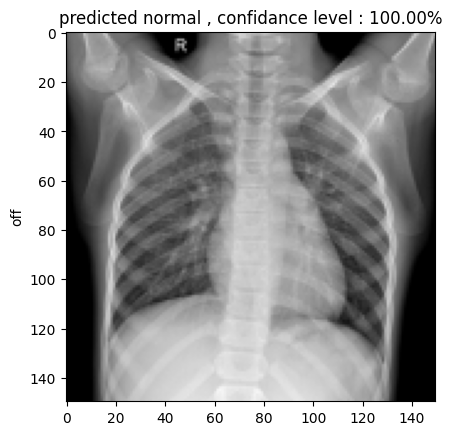

Image: /kaggle/input/covid19-radiography-database/COVID-19_Radiography_Dataset/Normal/images/Normal-1259.png
Predicted Class: normal, Confidence: 100.00%



In [30]:
import time

# Loop through every 3rd image from the first 300 images
for i in range(0, min(300, len(imagepath)), 3):
    image_path = imagepath[i]  # Get every 3rd image path from the list
    try:
        prediction_label, confidence_score = prediction_system(image_path, load_models, load_le)
        print(f"Image: {image_path}")
        print(f"Predicted Class: {prediction_label}, Confidence: {confidence_score * 100:.2f}%\n")
        time.sleep(2)  # Add a 2-second delay after displaying each image
    except ValueError as e:
        print(e)
